# Task 1 - Distribution of genes among the different clusters - 2_9591_cystic_branched
This notebook analyses the distribution of individual genes among the different clusters.

This notebook is based on the single-cell tutorial (https://github.com/theislab/single-cell-tutorial). For further explanations of the applied methods please refer to above source.

In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
import os
from os import listdir
from os.path import isfile, join
import logging

In [2]:
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3

### Load adata

In [3]:
adata = sc.read_h5ad('../data/adata/rev_processed_adata2.h5ad')
adata.obs

,sample_id,sample_nr,donor,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,log_counts,n_counts,n_genes,size_factors
AAACCCAAGAACGTGC-1-1-0-0-0-0-0,2_9591_cystic_branched,0,mouse,402,5.998937,504.0,6.224558,28.769841,40.079365,59.920635,100.000000,0.0,0.0,0.0,6.222576,504.0,402,0.008848
AAACCCAAGGATACCG-1-1-0-0-0-0-0,2_9591_cystic_branched,0,mouse,441,6.091310,577.0,6.359574,26.689775,40.901213,58.232236,100.000000,0.0,0.0,0.0,6.357842,577.0,441,0.009525
AAACCCAAGGGCAACT-1-1-0-0-0-0-0,2_9591_cystic_branched,0,mouse,557,6.324359,733.0,6.598509,25.920873,37.653479,51.296044,92.223738,0.0,0.0,0.0,6.597146,733.0,557,0.018177
AAACCCAAGGTGATAT-1-1-0-0-0-0-0,2_9591_cystic_branched,0,mouse,567,6.342121,741.0,6.609349,24.291498,36.977058,50.472335,90.958165,0.0,0.0,0.0,6.608001,741.0,567,0.016750
AAACCCAAGTGAGTGC-1-1-0-0-0-0-0,2_9591_cystic_branched,0,mouse,2382,7.776115,5605.0,8.631593,28.064228,35.379126,44.085638,59.732382,0.0,0.0,0.0,8.631414,5605.0,2382,0.123789
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCATATTCGG-1-1-0-0-0-0-0,2_9591_cystic_branched,0,mouse,1836,7.515889,3657.0,8.204672,24.965819,34.727919,45.419743,63.303254,0.0,0.0,0.0,8.204398,3657.0,1836,0.100919
TTTGTTGGTCCTACGG-1-1-0-0-0-0-0,2_9591_cystic_branched,0,mouse,1102,7.005789,1795.0,7.493317,24.846797,34.261838,46.128134,66.462396,0.0,0.0,0.0,7.492760,1795.0,1102,0.041187
TTTGTTGGTTTCAGAC-1-1-0-0-0-0-0,2_9591_cystic_branched,0,mouse,2822,7.945555,7161.0,8.876545,22.678397,31.350370,42.005307,58.469488,0.0,0.0,0.0,8.876405,7161.0,2822,0.170954
TTTGTTGTCCTTCGAC-1-1-0-0-0-0-0,2_9591_cystic_branched,0,mouse,520,6.255750,717.0,6.576469,30.543933,41.422594,55.369596,97.210600,0.0,0.0,0.0,6.575076,717.0,520,0.014303


<a id="Clustering"></a>

## Clustering

In [7]:
# Perform clustering - using highly variable genes
# sc.tl.louvain(adata, key_added='louvain_r1')
sc.tl.louvain(adata, resolution=0.5, key_added='louvain_r0.5', random_state=10)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 7 clusters and added
    'louvain_r0.5', the cluster labels (adata.obs, categorical) (0:00:01)


In [14]:
import pandas as pd

def merge_clusters(adata):
    # Create a mapping for the clusters to be merged
    merge_map = {
        '0': '0',
        '1': '1',
        '2': '0',
        '3': '2',
        '4': '2',
        '5': '1',
        '6': '0'
    }
    
    # Use the pandas `map` function to remap the clusters
    adata.obs['merged_louvain'] = adata.obs['louvain_r0.5'].map(merge_map).astype('category')
    
    # Update the categories for the new cluster labels
    adata.obs['merged_louvain'] = adata.obs['merged_louvain'].cat.set_categories(['0', '1', '2'])

# Assuming `adata` is your AnnData object
merge_clusters(adata)

In [15]:
adata.obs['merged_louvain']

AAACCCAAGAACGTGC-1-1-0-0-0-0-0    1
AAACCCAAGGATACCG-1-1-0-0-0-0-0    1
AAACCCAAGGGCAACT-1-1-0-0-0-0-0    1
AAACCCAAGGTGATAT-1-1-0-0-0-0-0    1
AAACCCAAGTGAGTGC-1-1-0-0-0-0-0    0
                                 ..
TTTGTTGCATATTCGG-1-1-0-0-0-0-0    2
TTTGTTGGTCCTACGG-1-1-0-0-0-0-0    0
TTTGTTGGTTTCAGAC-1-1-0-0-0-0-0    2
TTTGTTGTCCTTCGAC-1-1-0-0-0-0-0    1
TTTGTTGTCTACTCAT-1-1-0-0-0-0-0    0
Name: merged_louvain, Length: 18452, dtype: category
Categories (3, object): ['0', '1', '2']

/Users/till.richter/anaconda3/envs/celldreamer/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


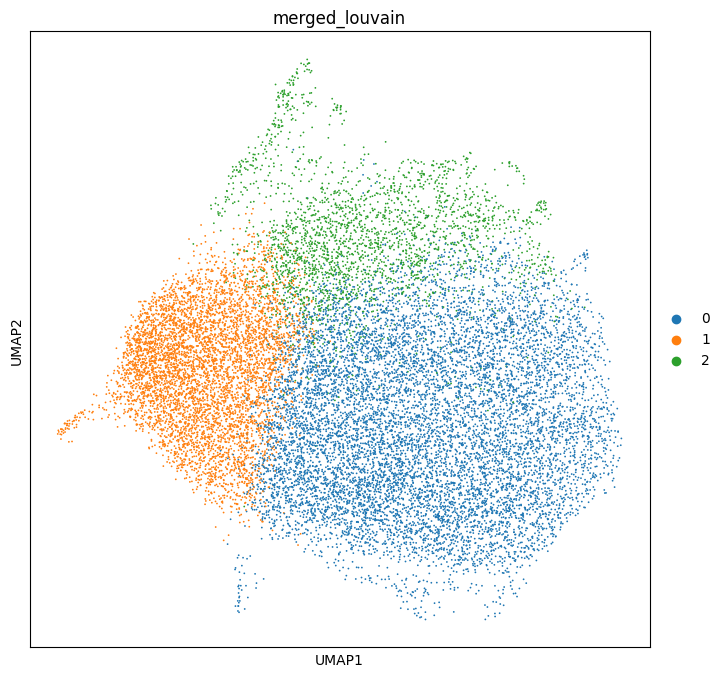

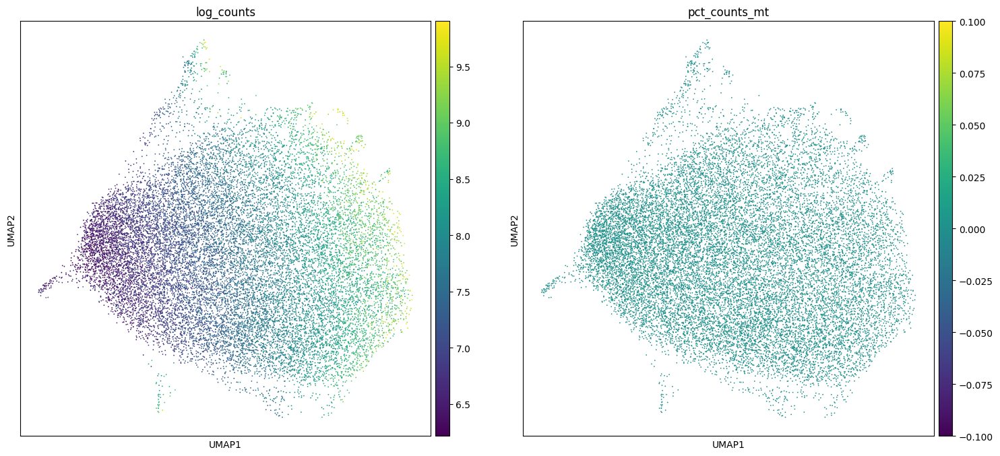

In [16]:
# Analysis sees 3 classes here
# Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(adata, color=['merged_louvain'])

sc.pl.umap(adata, color=['log_counts', 'pct_counts_mt'])

/Users/till.richter/anaconda3/envs/celldreamer/lib/python3.11/site-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


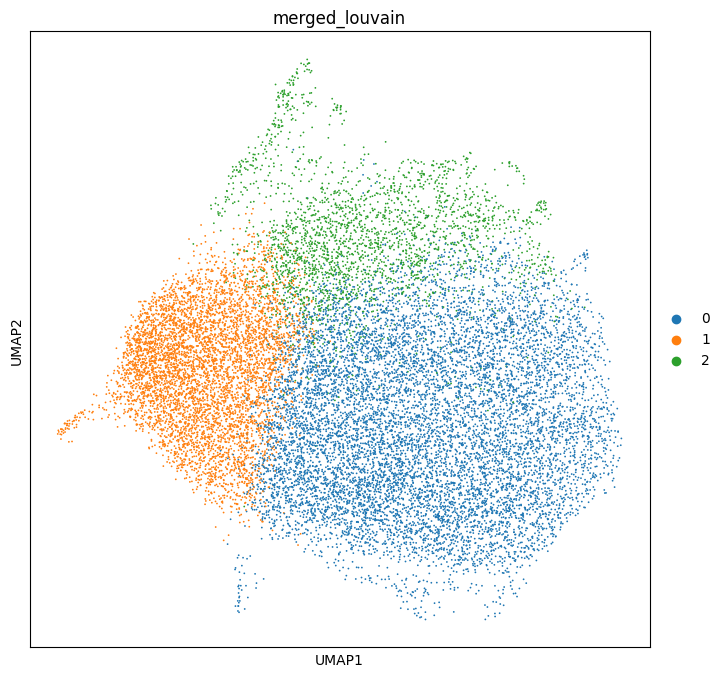

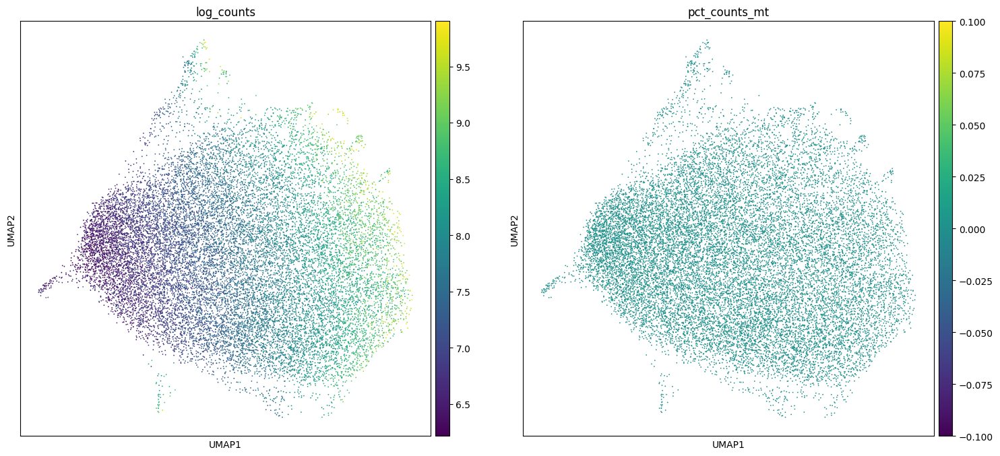

In [17]:
# Analysis sees 3 classes here
# Visualize the clustering and how this is reflected by different technical covariates
sc.pl.umap(adata, color=['merged_louvain'], save='umap_2_9591_cystic_branched.pdf')
# os.rename("figures/umap2_9591_cystic_branched.pdf", 
#           "../rev_results/task1/2_9591_cystic_branched/UMAP.pdf")

sc.pl.umap(adata, color=['log_counts', 'pct_counts_mt'], save='umap_counts_2_9591_cystic_branched.pdf')
# os.rename("figures/umap/2_9591_cystic_branched/UMAP_counts.pdf", 
#           "../rev_results/task1/2_9591_cystic_branched/UMAP_counts.pdf")

<a id="Markers"></a>

## Marker genes & cluster annotation

In [18]:
# Create a new AnnData object with gene symbols as var indices
adata_tmp = sc.AnnData(
    X=adata.X,  # Assuming you want to keep the same expression data
    obs=adata.obs.copy(),  # Copy the obs information from the original AnnData
)

# Set the gene symbols as var indices
adata_tmp.var.index = adata.var['gene_symbols-0-0-0-0-0-0']

In [19]:
# Perform gene ranking on the modified AnnData object
sc.tl.rank_genes_groups(adata_tmp, groupby='merged_louvain', key_added='rank_genes_merged_louvain')



ranking genes
    finished: added to `.uns['rank_genes_merged_louvain']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


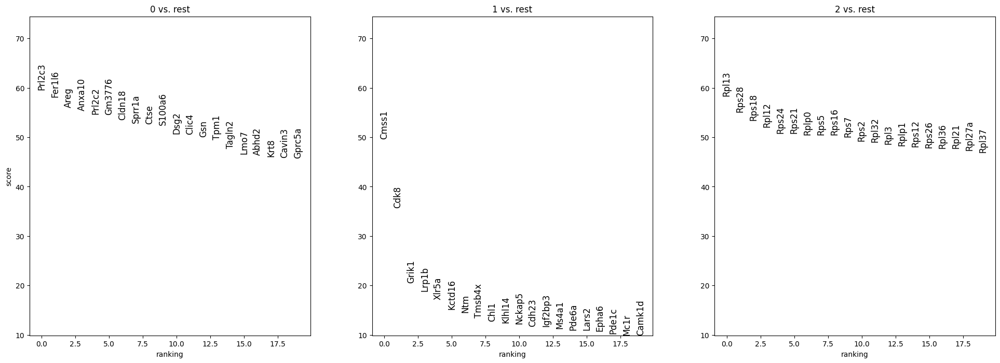

In [21]:
# Visualize the results using gene symbols
sc.pl.rank_genes_groups(adata_tmp, key='rank_genes_merged_louvain', groups=['0', '1', '2'], fontsize=12)

In [22]:
# Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

Below we plot genes of particular interest within the clusters

### Cluster 0

Encrypted symbol for  Prl2c3 is  ENSMUSG00000056457


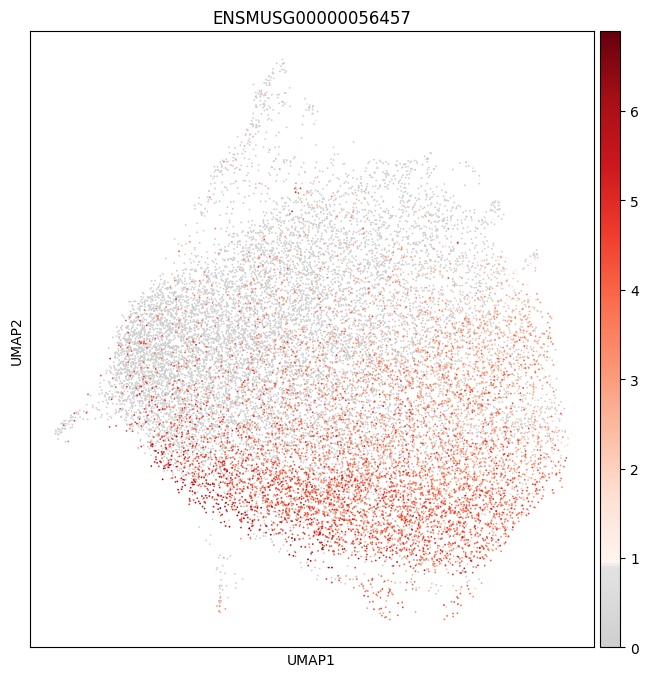

Encrypted symbol for  Fer1l6 is  ENSMUSG00000037106


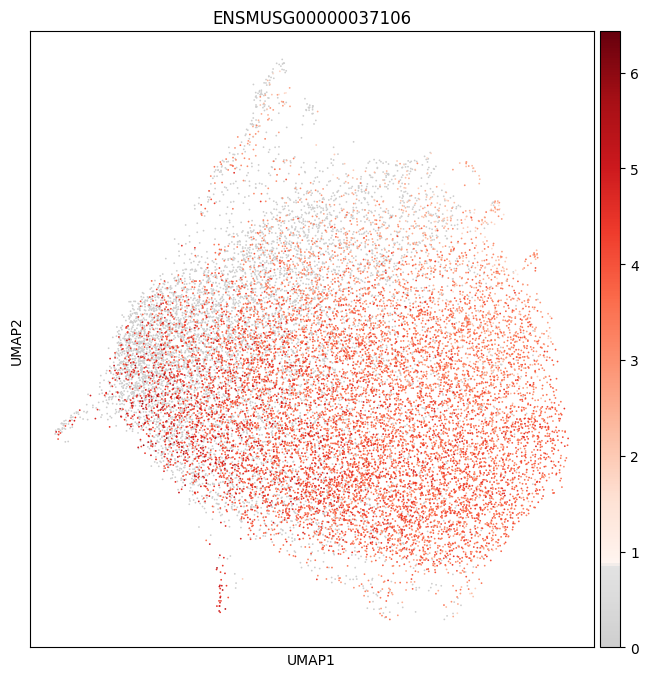

Encrypted symbol for  Areg is  ENSMUSG00000029378


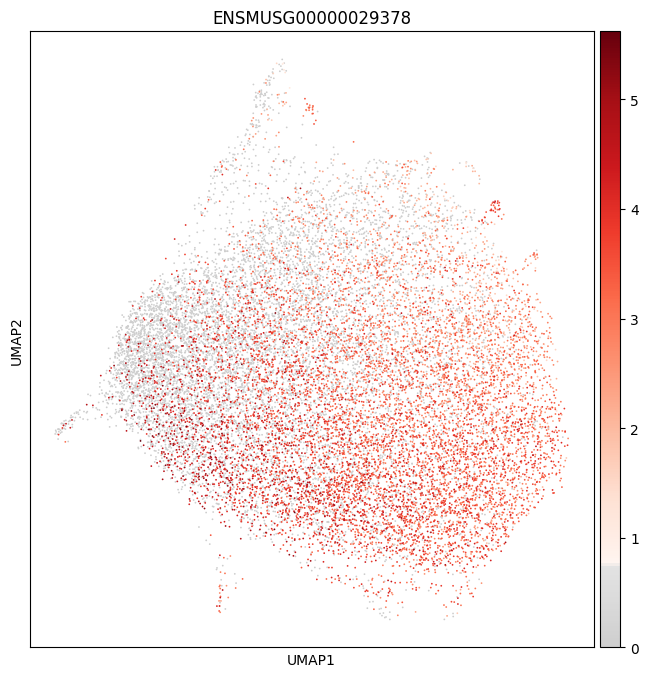

Encrypted symbol for  Anxa10 is  ENSMUSG00000031635


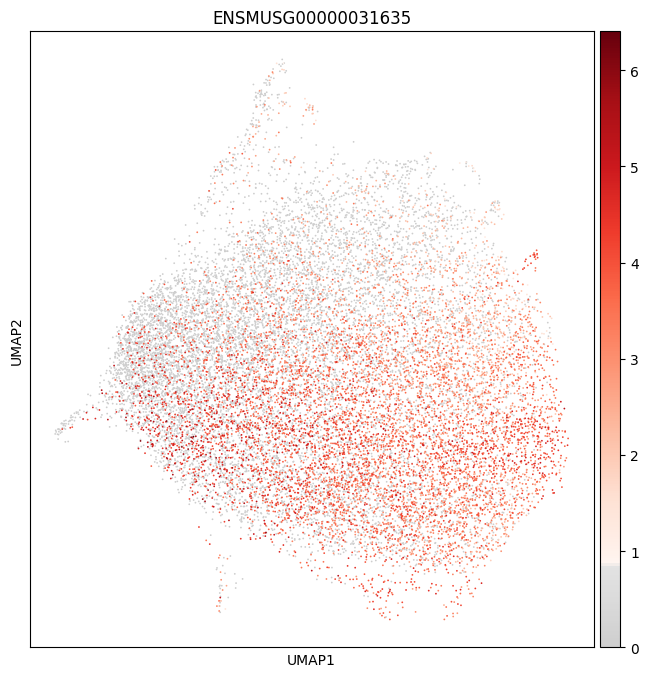

In [23]:
gene_symbols = ['Prl2c3', 'Fer1l6', 'Areg', 'Anxa10']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata.var[adata.var['gene_symbols-0-0-0-0-0-0'] == gene_symbol].index[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=encrypted_symbol, use_raw=False, color_map=mymap, save='/2_9591_cystic_branched_Cluster0_' + gene_symbol + '.pdf')


## Cluster 1

Encrypted symbol for  Cmss1 is  ENSMUSG00000022748


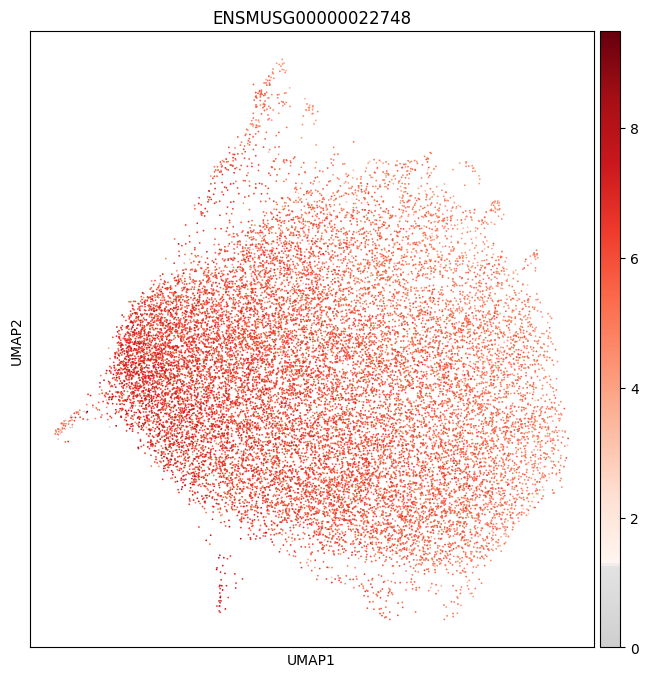

Encrypted symbol for  Cdk8 is  ENSMUSG00000029635


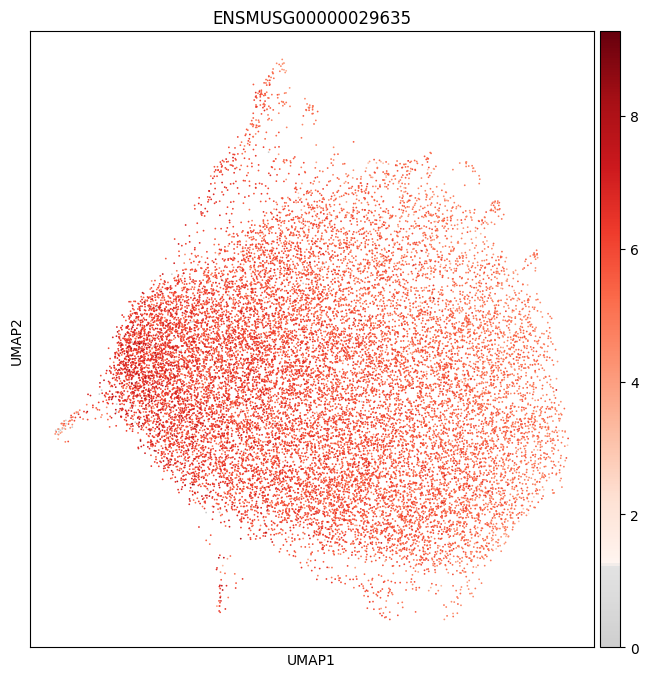

Encrypted symbol for  Grik1 is  ENSMUSG00000022935


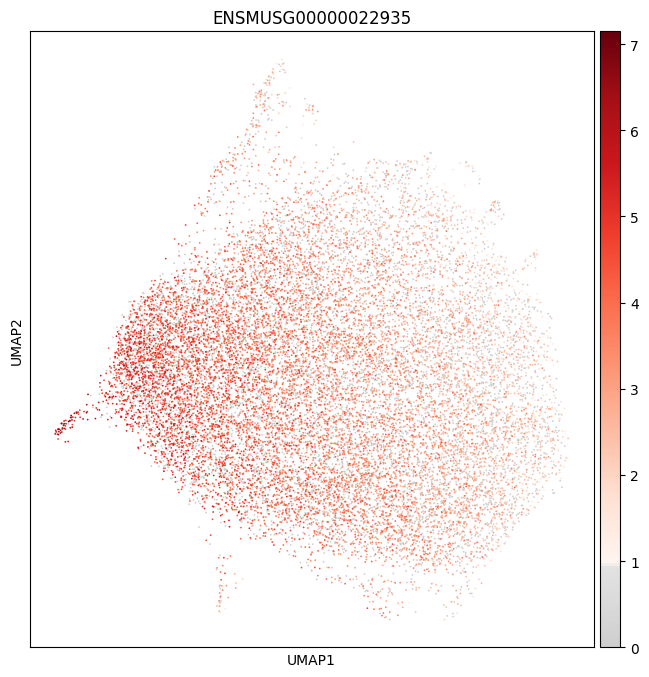

Encrypted symbol for  Lrp1b is  ENSMUSG00000049252


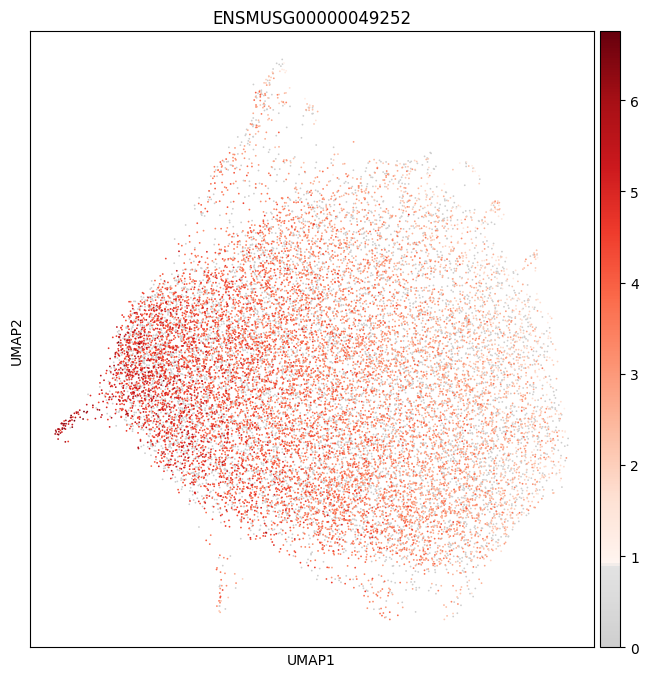

In [24]:
gene_symbols = ['Cmss1', 'Cdk8', 'Grik1', 'Lrp1b']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata.var[adata.var['gene_symbols-0-0-0-0-0-0'] == gene_symbol].index[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=encrypted_symbol, use_raw=False, color_map=mymap, save='/2_9591_cystic_branched_Cluster1_' + gene_symbol + '.pdf')


## Cluster 2

Encrypted symbol for  Rpl13 is  ENSMUSG00000000740


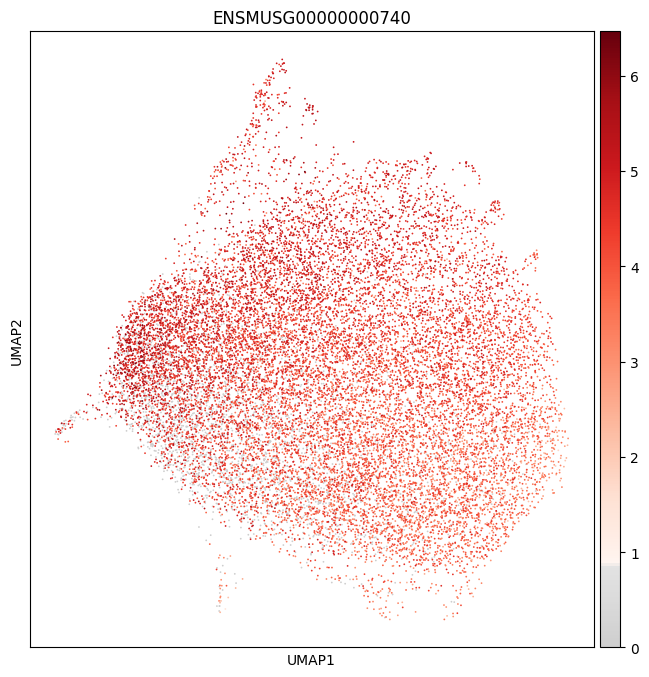

Encrypted symbol for  Rps28 is  ENSMUSG00000067288


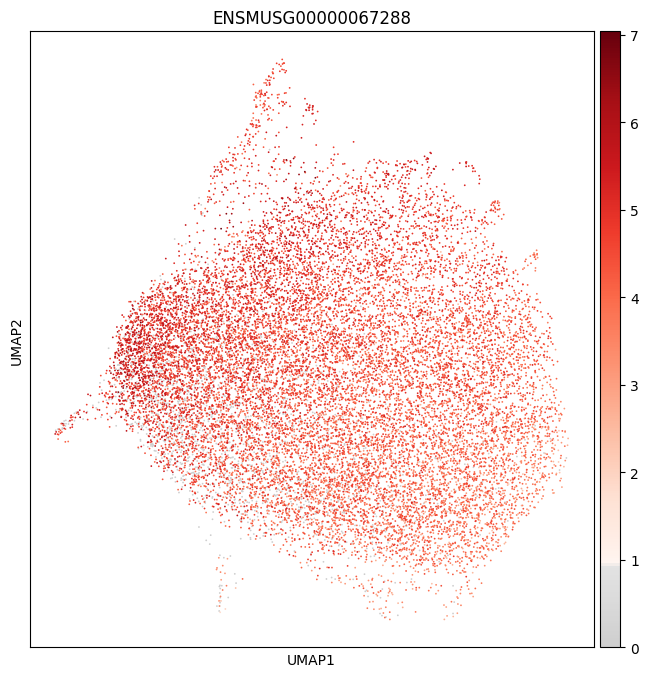

Encrypted symbol for  Rps18 is  ENSMUSG00000008668


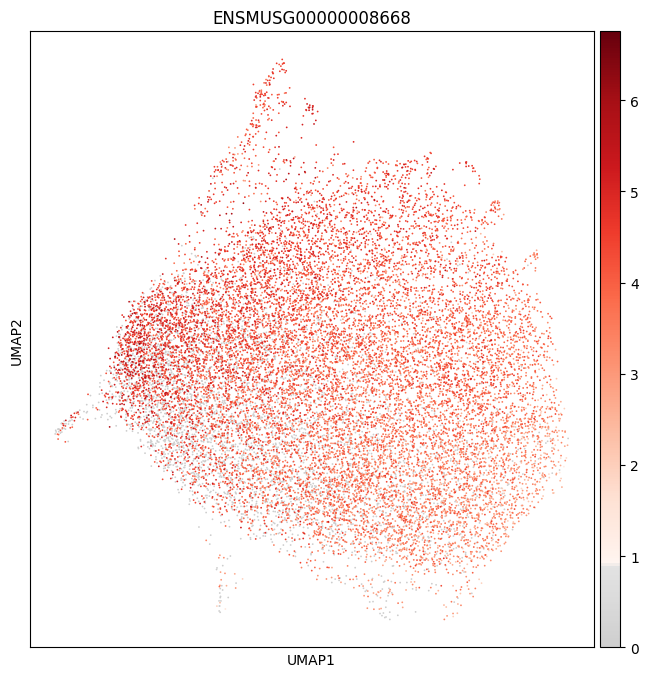

Encrypted symbol for  Rpl12 is  ENSMUSG00000038900


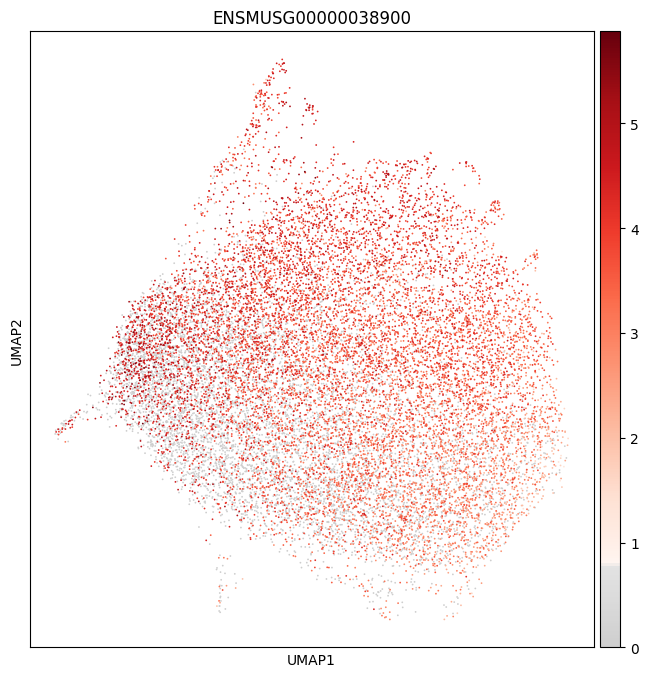

In [25]:
gene_symbols = ['Rpl13', 'Rps28', 'Rps18', 'Rpl12']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata.var[adata.var['gene_symbols-0-0-0-0-0-0'] == gene_symbol].index[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=encrypted_symbol, use_raw=False, color_map=mymap, save='/2_9591_cystic_branched_Cluster2_' + gene_symbol + '.pdf')


Encrypted symbol for  Xlr5a is  ENSMUSG00000058328


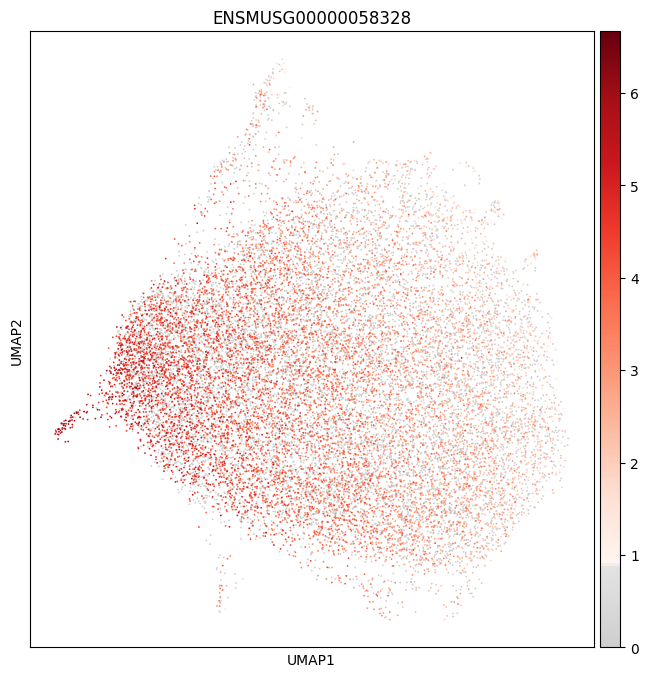

Encrypted symbol for  Lrp1b is  ENSMUSG00000049252


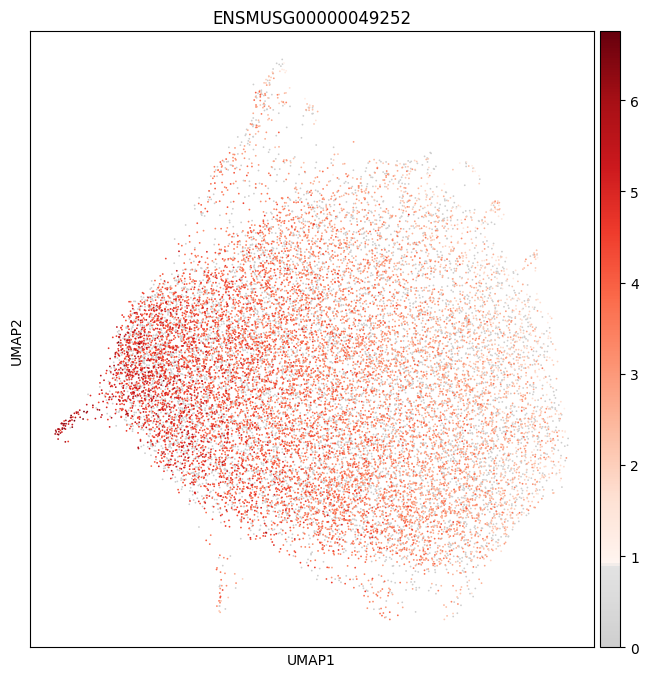

Encrypted symbol for  Grik1 is  ENSMUSG00000022935


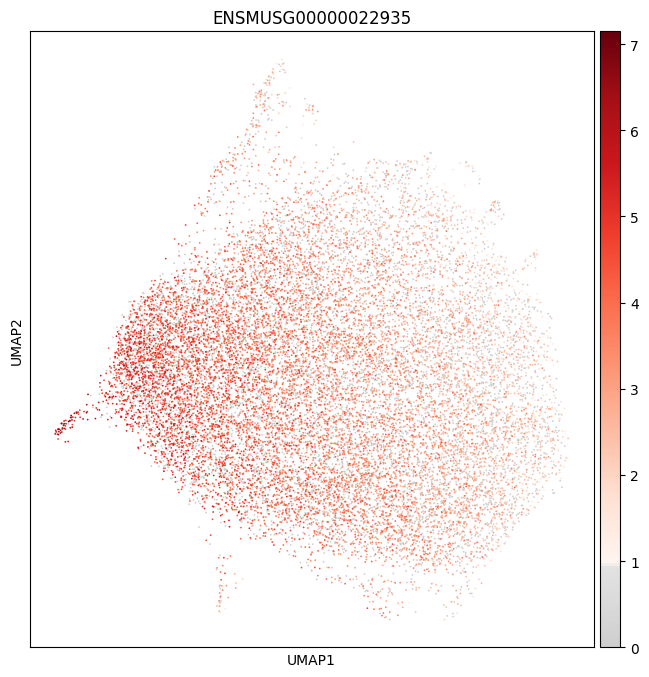

Encrypted symbol for  Chl1 is  ENSMUSG00000030077


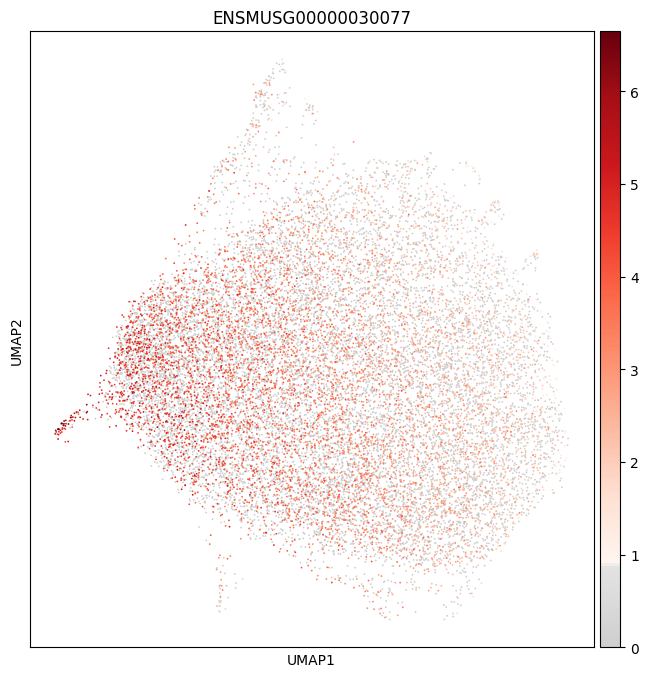

In [16]:
gene_symbols = ['Xlr5a', 'Lrp1b', 'Grik1', 'Chl1']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata.var[adata.var['gene_symbols-0-0-0-0-0-0'] == gene_symbol].index[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=encrypted_symbol, use_raw=False, color_map=mymap, save='/2_9591_cystic_branched_Cluster4_' + gene_symbol + '.pdf')


Encrypted symbol for  Gphn is  ENSMUSG00000047454


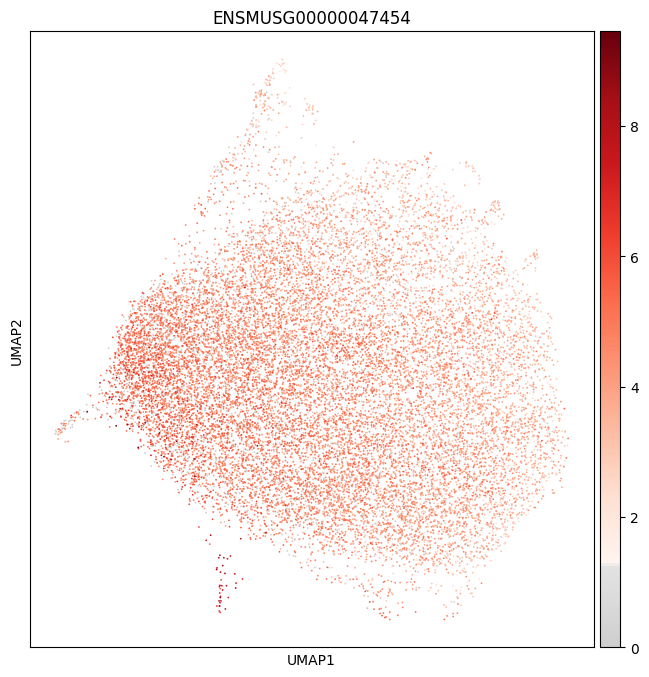

In [17]:
gene_symbols = ['Gphn']

for gene_symbol in gene_symbols:
    encrypted_symbol = adata.var[adata.var['gene_symbols-0-0-0-0-0-0'] == gene_symbol].index[0]
    print('Encrypted symbol for ', gene_symbol, 'is ', encrypted_symbol)
    sc.pl.umap(adata, color=encrypted_symbol, use_raw=False, color_map=mymap, save='/2_9591_cystic_branched_Cluster5_' + gene_symbol + '.pdf')
